# Comparison of different MPI calibrations

I did several MPI calibrations :
- two between nodes `taurus-15` and `taurus-5`,
- two between nodes `taurus-6` and `taurus-8`.

The two calibrations on a same cluster have been made on different jobs, hence a full deployment has been done in between.
In this notebook, I try to see if we can identify any difference, and how.

In [1]:
import pandas
import altair
import pytree
import os
print(pytree.__version__, pytree.__git_version__)

0.0.2 1d3b42da23e230f3e79ca9381471a91e96d20c6b


# Utility functions

These are used to build the dataframes from the archive content.

In [2]:
import zipfile
import io


def extract_zip(zip_name):
    '''Taken from https://stackoverflow.com/a/10909016/4110059'''
    input_zip = zipfile.ZipFile(zip_name)
    result = {}
    for name in input_zip.namelist():
        dataframe = pandas.read_csv(io.BytesIO(input_zip.read(name)), names = ['op', 'msg_size', 'start', 'duration'])
        dataframe['experiment'] = zip_name
        dataframe['type'] = name
        result[name] = dataframe
    del result['exp/']
    return result


def extract_folder(folder_name):
    result = {}
    for root, dirs, files in os.walk(folder_name):
        for file in files:
            if file.endswith(".zip"):
                filename = os.path.join(root, file)
                result[filename] = extract_zip(filename)
    return result


def aggregate_dataframe(dataframe):
    df = dataframe.groupby('msg_size').mean().reset_index()
    df['experiment'] = dataframe['experiment'].unique()[0]
    return df


def sample_dataframe(dataframe):
    return dataframe.sample(frac=0.03)


def merge_dataframes(folder_dict, dataframe_name, dataframe_processing=lambda x: x):
    all_df = []
    for folder, dataframes in folder_dict.items():
        all_df.append(dataframe_processing(dataframes[dataframe_name]))
    return pandas.concat(all_df)

In [3]:
dataframes = extract_folder('results')
alldf = merge_dataframes(dataframes, 'exp/exp_Recv.csv')
print(len(alldf))
print(alldf.head())

132400
         op  msg_size     start  duration  \
0  MPI_Recv    765921  0.013005  0.001556   
1  MPI_Recv    765921  0.020560  0.001345   
2  MPI_Recv    765921  0.027793  0.001388   
3  MPI_Recv    765921  0.035174  0.001367   
4  MPI_Recv    765921  0.042435  0.001372   

                                    experiment              type  
0  results/taurus-15-taurus-5_2018-06-08_2.zip  exp/exp_Recv.csv  
1  results/taurus-15-taurus-5_2018-06-08_2.zip  exp/exp_Recv.csv  
2  results/taurus-15-taurus-5_2018-06-08_2.zip  exp/exp_Recv.csv  
3  results/taurus-15-taurus-5_2018-06-08_2.zip  exp/exp_Recv.csv  
4  results/taurus-15-taurus-5_2018-06-08_2.zip  exp/exp_Recv.csv  


# Plot of the datasets

Note: these plots are interactive, try to select and move an interval in one of them.

In [4]:
import altair as alt

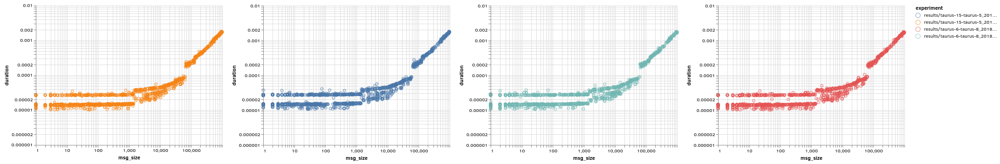

In [5]:
# alt.data_transformers.enable('csv')
ydomain = [min(alldf.duration), max(alldf.duration)]
brush = alt.selection_interval(encodings=['x'])

chart = alt.Chart(alldf.sample(n=5000)).mark_point(opacity=0.5).encode(   # *IMPORTANT* note that we have sampled the dataframe, for better plot interactivity
    x=alt.X('msg_size', scale=alt.Scale(type='log')),
    y=alt.Y('duration', scale=alt.Scale(type='log', domain=ydomain)),
    color=alt.condition(brush, 'experiment', alt.value('lightgray'))
).add_selection(
    brush
)

final = (
    chart.transform_filter(alt.datum.experiment=='results/taurus-15-taurus-5_2018-06-08_2.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-15-taurus-5_2018-06-08.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-6-taurus-8_2018-06-08_2.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-6-taurus-8_2018-06-08.zip')
)
final

# Regressions

First, we compute a regression with aggregated data to find the breakpoints.

In [6]:
df = aggregate_dataframe(extract_zip('results/taurus-15-taurus-5_2018-06-08_2.zip')['exp/exp_Recv.csv'])
reg = pytree.compute_regression(df.msg_size, df.duration, mode='BIC')
breakpoints = reg.breakpoints
reg.flatify()

-inf < x ≤ 1.382e+03
	y ~ 2.537e-09x + 1.756e-05
1.382e+03 < x ≤ 6.279e+04
	y ~ 1.023e-09x + 2.824e-05
6.279e+04 < x ≤ inf
	y ~ 1.745e-09x + 6.852e-05

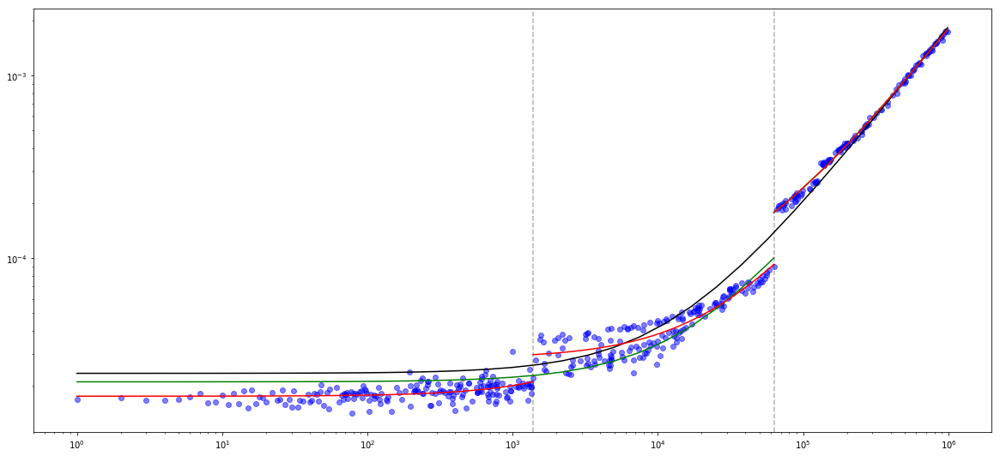

In [7]:
reg.plot_dataset(log=True)

Then we compute a regression on non-aggregated data with the breakpoints we have found.

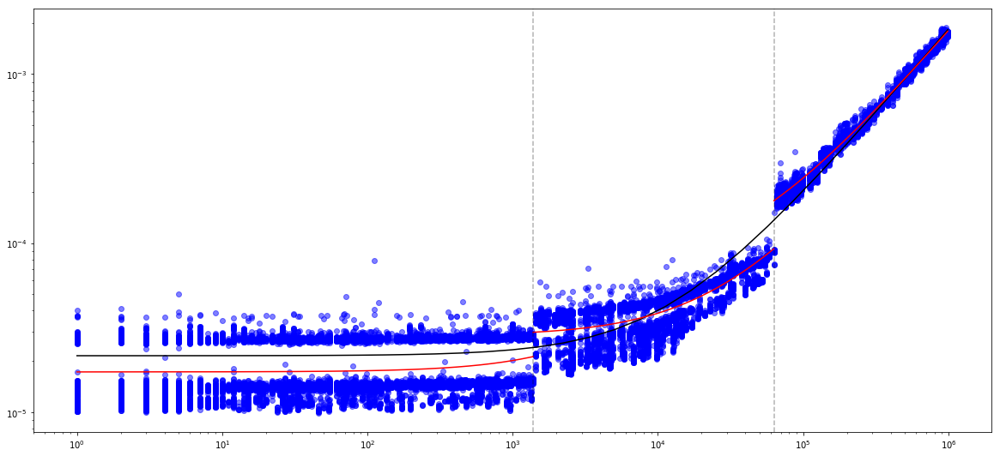

In [8]:
df = extract_zip('results/taurus-15-taurus-5_2018-06-08_2.zip')['exp/exp_Recv.csv']
reg = pytree.compute_regression(df.msg_size, df.duration, breakpoints=breakpoints)
reg.plot_dataset(log=True)

Now, we compute the residuals for all the datasets with **this** particular regression.

In [9]:
def compute_residuals(df, reg):
    df['predict'] = df.msg_size.apply(reg.predict)
    df['residual'] = df.duration - df.predict
    df['residual_square'] = df.residual ** 2

compute_residuals(alldf, reg)
alldf.head()

,op,msg_size,start,duration,experiment,type,predict,residual,residual_square
0,MPI_Recv,765921,0.013005,0.001556,results/taurus-15-taurus-5_2018-06-08_2.zip,exp/exp_Recv.csv,0.001405,0.000151,2.275829e-08
1,MPI_Recv,765921,0.020560,0.001345,results/taurus-15-taurus-5_2018-06-08_2.zip,exp/exp_Recv.csv,0.001405,-0.000060,3.542690e-09
2,MPI_Recv,765921,0.027793,0.001388,results/taurus-15-taurus-5_2018-06-08_2.zip,exp/exp_Recv.csv,0.001405,-0.000017,2.906512e-10
3,MPI_Recv,765921,0.035174,0.001367,results/taurus-15-taurus-5_2018-06-08_2.zip,exp/exp_Recv.csv,0.001405,-0.000038,1.432206e-09
4,MPI_Recv,765921,0.042435,0.001372,results/taurus-15-taurus-5_2018-06-08_2.zip,exp/exp_Recv.csv,0.001405,-0.000033,1.075348e-09


### Plots of the residuals

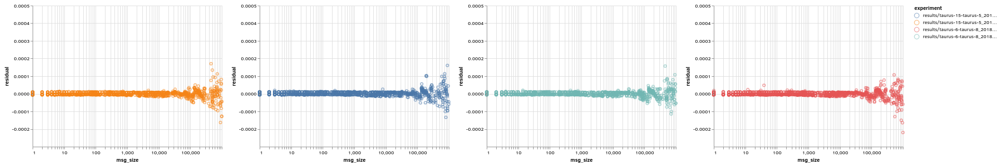

In [10]:
ydomain = [min(alldf.residual), max(alldf.residual)]
brush = alt.selection_interval(encodings=['x'])

chart = alt.Chart(alldf.sample(n=5000)).mark_point(opacity=0.5).encode(  # *IMPORTANT* note that we have sampled the dataframe, for better plot interactivity
    x=alt.X('msg_size', scale=alt.Scale(type='log')),
    y=alt.Y('residual', scale=alt.Scale(domain=ydomain)),
    color=alt.condition(brush, 'experiment', alt.value('lightgray'))
).add_selection(
    brush
)

final = (
    chart.transform_filter(alt.datum.experiment=='results/taurus-15-taurus-5_2018-06-08_2.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-15-taurus-5_2018-06-08.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-6-taurus-8_2018-06-08_2.zip') |
    chart.transform_filter(alt.datum.experiment=='results/taurus-6-taurus-8_2018-06-08.zip')
)
final

### Statistical tests on the residuals

Houw could we automatically tell if two datasets are significantly different or not? A possibility could be to compare the mean of the squares of the residuals (remainder: this residuals have been obtained with a model computed on a possibly different dataset). One good way to compare two means is to do a t-test. The P-value is the probability for the two means to be equal. Usually, we consider them to be different when the P-value is below a threshold of 5%.

In [11]:
from scipy import stats
def test_residuals(df, exp1, exp2):
    return stats.ttest_ind(df[df.experiment == exp1].residual_square, df[df.experiment == exp2].residual_square)

In [12]:
experiments = list(dataframes.keys())
for exp1 in experiments:
    for exp2 in experiments:
        print('%.2f' % test_residuals(alldf, exp1, exp2).pvalue, end=' ')
    print()

1.00 0.44 0.73 0.87 
0.44 1.00 0.69 0.54 
0.73 0.69 1.00 0.85 
0.87 0.54 0.85 1.00 


All the P-values are above 0.05 (even above 0.4), so we can consider that the mean of the squares of the residuals are equal. In other words, the model we have found for **one** of the datasets fits as well the **other** datasets.